## Dimensionality reduction practical

In [210]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

## 0. Data preprocessing and visualization

1. Load the "ionosphere.csv" dataset
2. Clean the dataset, remove N/A s, uninformative columns if any
3. Construct and plot inter feature correlation matrice
4. Investigate distributions of each feature(make histogram plots), decide if the dataset needs normalization or not, if yes normalize it
5. Last column is the target column which we will predict. Map (b, g) -> (0, 1)
6. Split the dataset to train/test with 80/20 ratio


In [211]:
df = pd.read_csv('ionosphere.csv',header=None)
df.head()



,0,1,2,3,4,5,6,7,8,9,...,25,26,27,28,29,30,31,32,33,34
0,1,0,0.99539,-0.05889,0.85243,0.02306,0.83398,-0.37708,1.00000,0.03760,...,-0.51171,0.41078,-0.46168,0.21266,-0.34090,0.42267,-0.54487,0.18641,-0.45300,g
1,1,0,1.00000,-0.18829,0.93035,-0.36156,-0.10868,-0.93597,1.00000,-0.04549,...,-0.26569,-0.20468,-0.18401,-0.19040,-0.11593,-0.16626,-0.06288,-0.13738,-0.02447,b
2,1,0,1.00000,-0.03365,1.00000,0.00485,1.00000,-0.12062,0.88965,0.01198,...,-0.40220,0.58984,-0.22145,0.43100,-0.17365,0.60436,-0.24180,0.56045,-0.38238,g
3,1,0,1.00000,-0.45161,1.00000,1.00000,0.71216,-1.00000,0.00000,0.00000,...,0.90695,0.51613,1.00000,1.00000,-0.20099,0.25682,1.00000,-0.32382,1.00000,b
4,1,0,1.00000,-0.02401,0.94140,0.06531,0.92106,-0.23255,0.77152,-0.16399,...,-0.65158,0.13290,-0.53206,0.02431,-0.62197,-0.05707,-0.59573,-0.04608,-0.65697,g


In [212]:
df=df.drop([1], axis=1)
df=df.drop([0], axis=1)
#print(df.corr())
#df.isnull().sum()

In [213]:
target_col = 34
df.loc[df[target_col] == 'g', 34] = 1
df.loc[df[target_col] == 'b', 34] = 0
df[target_col] = df[target_col].astype(int)
df

,2,3,4,5,6,7,8,9,10,11,...,25,26,27,28,29,30,31,32,33,34
0,0.99539,-0.05889,0.85243,0.02306,0.83398,-0.37708,1.00000,0.03760,0.85243,-0.17755,...,-0.51171,0.41078,-0.46168,0.21266,-0.34090,0.42267,-0.54487,0.18641,-0.45300,1
1,1.00000,-0.18829,0.93035,-0.36156,-0.10868,-0.93597,1.00000,-0.04549,0.50874,-0.67743,...,-0.26569,-0.20468,-0.18401,-0.19040,-0.11593,-0.16626,-0.06288,-0.13738,-0.02447,0
2,1.00000,-0.03365,1.00000,0.00485,1.00000,-0.12062,0.88965,0.01198,0.73082,0.05346,...,-0.40220,0.58984,-0.22145,0.43100,-0.17365,0.60436,-0.24180,0.56045,-0.38238,1
3,1.00000,-0.45161,1.00000,1.00000,0.71216,-1.00000,0.00000,0.00000,0.00000,0.00000,...,0.90695,0.51613,1.00000,1.00000,-0.20099,0.25682,1.00000,-0.32382,1.00000,0
4,1.00000,-0.02401,0.94140,0.06531,0.92106,-0.23255,0.77152,-0.16399,0.52798,-0.20275,...,-0.65158,0.13290,-0.53206,0.02431,-0.62197,-0.05707,-0.59573,-0.04608,-0.65697,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346,0.83508,0.08298,0.73739,-0.14706,0.84349,-0.05567,0.90441,-0.04622,0.89391,0.13130,...,-0.04202,0.83479,0.00123,1.00000,0.12815,0.86660,-0.10714,0.90546,-0.04307,1
347,0.95113,0.00419,0.95183,-0.02723,0.93438,-0.01920,0.94590,0.01606,0.96510,0.03281,...,0.01361,0.93522,0.04925,0.93159,0.08168,0.94066,-0.00035,0.91483,0.04712,1
348,0.94701,-0.00034,0.93207,-0.03227,0.95177,-0.03431,0.95584,0.02446,0.94124,0.01766,...,0.03193,0.92489,0.02542,0.92120,0.02242,0.92459,0.00442,0.92697,-0.00577,1
349,0.90608,-0.01657,0.98122,-0.01989,0.95691,-0.03646,0.85746,0.00110,0.89724,-0.03315,...,-0.02099,0.89147,-0.07760,0.82983,-0.17238,0.96022,-0.03757,0.87403,-0.16243,1


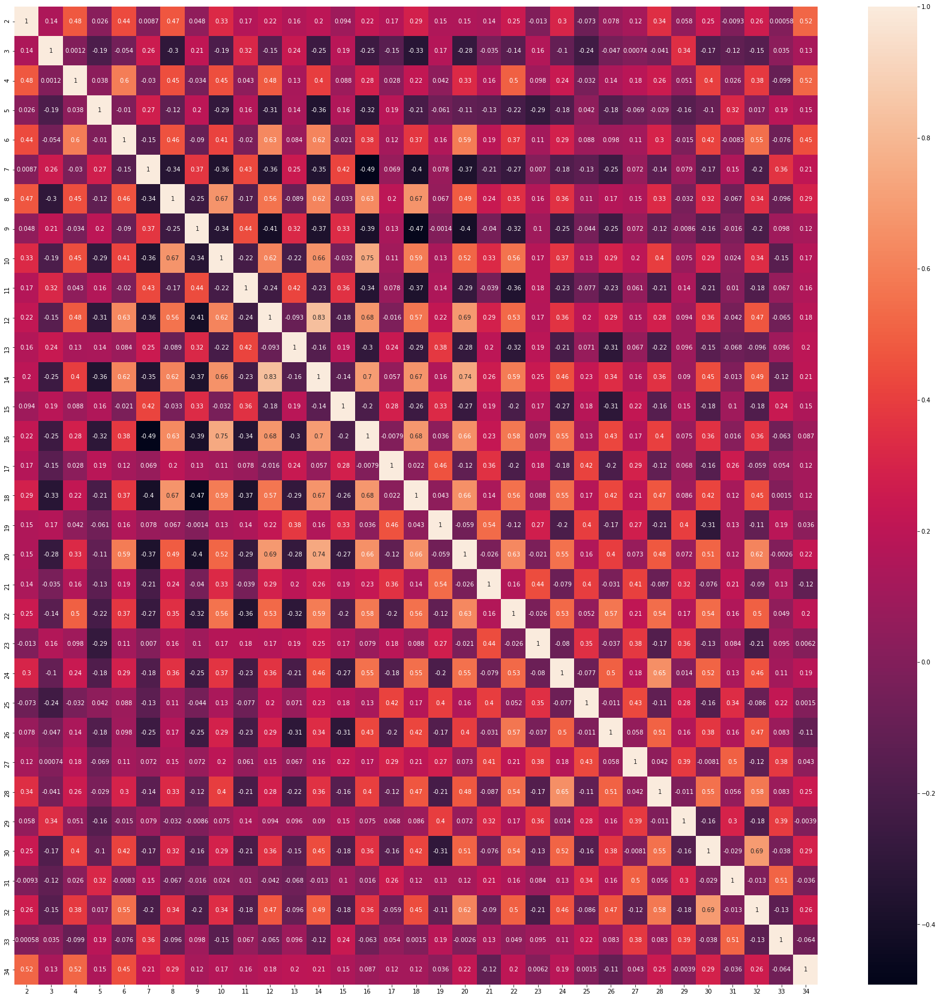

In [214]:
import seaborn as sns
plt.figure(figsize=(30, 30))
sns.heatmap(df.corr(),annot=True)

In [215]:
df.describe()

,2,3,4,5,6,7,8,9,10,11,...,25,26,27,28,29,30,31,32,33,34
count,351.000000,351.000000,351.000000,351.000000,351.000000,351.000000,351.000000,351.000000,351.000000,351.000000,...,351.000000,351.000000,351.000000,351.000000,351.000000,351.000000,351.000000,351.000000,351.000000,351.000000
mean,0.641342,0.044372,0.601068,0.115889,0.550095,0.119360,0.511848,0.181345,0.476183,0.155040,...,-0.071187,0.541641,-0.069538,0.378445,-0.027907,0.352514,-0.003794,0.349364,0.014480,0.641026
std,0.497708,0.441435,0.519862,0.460810,0.492654,0.520750,0.507066,0.483851,0.563496,0.494817,...,0.508495,0.516205,0.550025,0.575886,0.507974,0.571483,0.513574,0.522663,0.468337,0.480384
min,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.000000
25%,0.472135,-0.064735,0.412660,-0.024795,0.211310,-0.054840,0.087110,-0.048075,0.021120,-0.065265,...,-0.332390,0.286435,-0.443165,0.000000,-0.236885,0.000000,-0.242595,0.000000,-0.165350,0.000000
50%,0.871110,0.016310,0.809200,0.022800,0.728730,0.014710,0.684210,0.018290,0.667980,0.028250,...,-0.015050,0.708240,-0.017690,0.496640,0.000000,0.442770,0.000000,0.409560,0.000000,1.000000
75%,1.000000,0.194185,1.000000,0.334655,0.969240,0.445675,0.953240,0.534195,0.957895,0.482375,...,0.156765,0.999945,0.153535,0.883465,0.154075,0.857620,0.200120,0.813765,0.171660,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


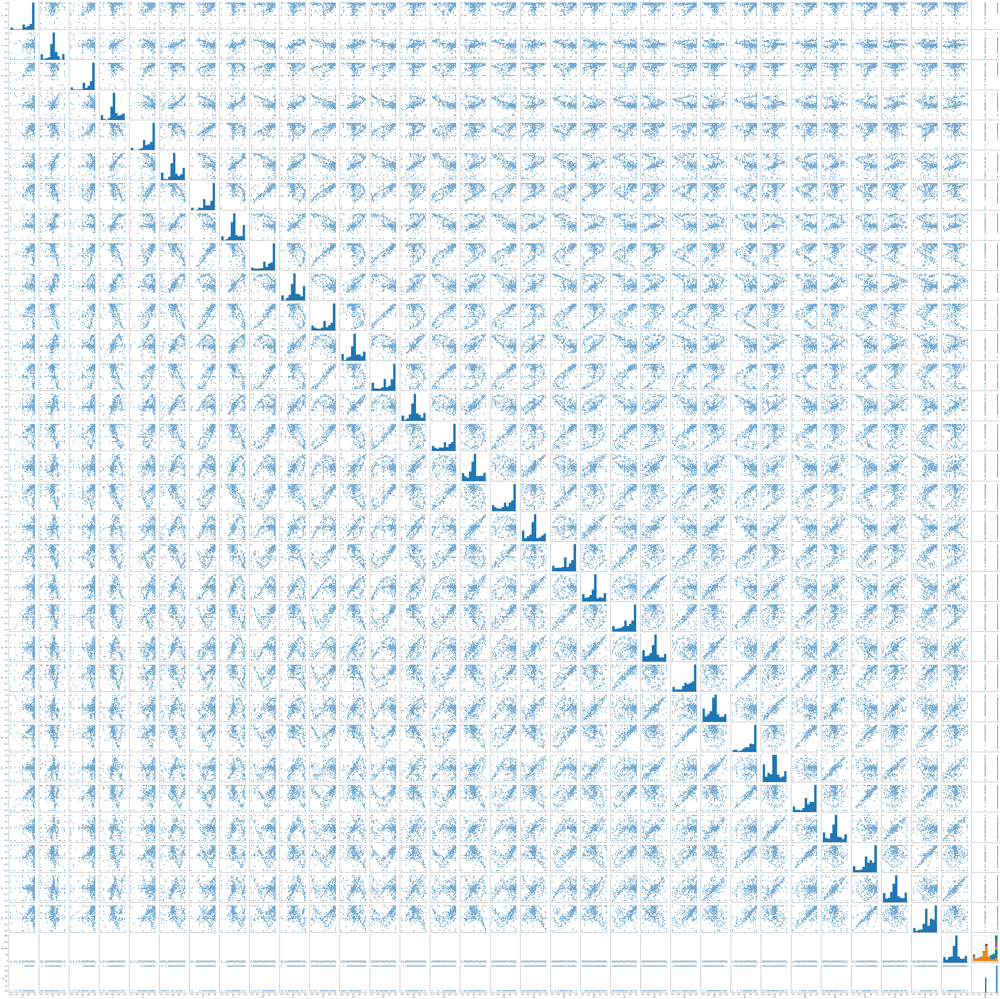

In [26]:
#plt.figure(figsize=(100, 100))
sns.pairplot(df)


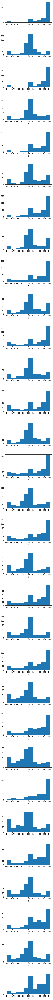

In [216]:
fig, axs = plt.subplots(31, 1)
fig.set_figwidth(5)
fig.set_figheight(90)
fig.tight_layout(h_pad = 5)
for i in range(31):
    axs[i].hist(df[i+2])
    axs[i].set_xlabel(i+2)


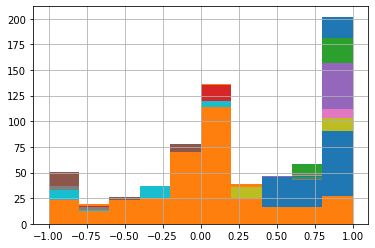

In [217]:
for i in range(2,34):
    df[i].hist()

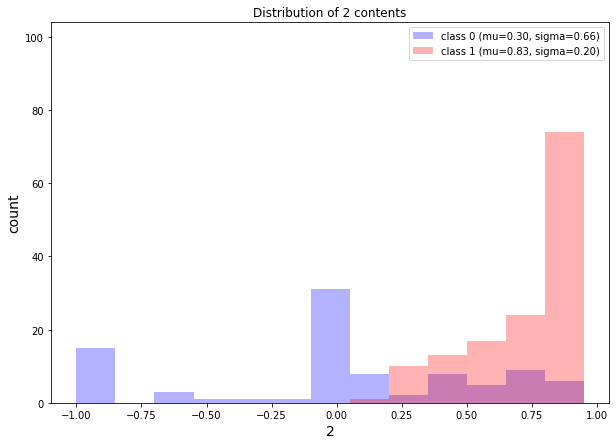

In [218]:
plt.figure(figsize=(10, 7))
from math import floor, ceil
# bin width of the histogram in steps of 0.15
bins = np.arange(floor(min(df[2])), ceil(max(df[2])), 0.15)

# get the max count for a particular bin for all classes combined
max_bin = max(np.histogram(df[2], bins=bins)[0])

# the order of the colors for each histogram
colors = ('blue', 'red')
y=df[34]
for label,color in zip(
        range(2), colors):

    mean = np.mean(df[2][y == label]) # class sample mean
    stdev = np.std(df[2][y == label]) # class standard deviation
    plt.hist(df[2][y == label],
             bins=bins,
             alpha=0.3, # opacity level
             label='class {} (mu={:.2f}, sigma={:.2f})'.format(label, mean, stdev),
             color=color)

plt.ylim([0, max_bin*1.3])
plt.title('Distribution of 2 contents')
plt.xlabel('2', fontsize=14)
plt.ylabel('count', fontsize=14)
plt.legend(loc='upper right')

plt.show()

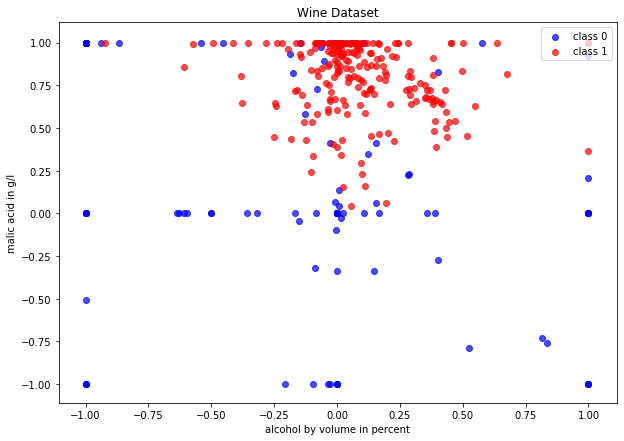

In [219]:
plt.figure(figsize=(10, 7))

for label,color in zip(
        range(2),('blue', 'red')):

    plt.scatter(x=df[3][y == label], 
                y=df[4][y == label], 
                color=color,
                alpha=0.7,
                label='class {:}'.format(label) 
                )

plt.title('Wine Dataset')
plt.xlabel('alcohol by volume in percent')
plt.ylabel('malic acid in g/l')
plt.legend(loc='upper right')

plt.show()

In [220]:
from sklearn.model_selection import train_test_split
xTrain, xTest, yTrain, yTest = train_test_split(df[df.columns.difference([34])],df[34], test_size=0.2, random_state=49)


In [247]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
xTrain=scaler.fit_transform(xTrain)
xTest=scaler.transform(xTest)

## 1. Classification baseline

Using Logistic Regression of sklearn, run a grid search on parameter C from the values [0.01, 0.1, 1., 10, 100]. Select the best model by running 5 Fold cross validation on train set according to f1 score.

In [48]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score
l1= [0.01, 0.1, 1., 10, 100]
for i in l1:
    logreg = LogisticRegression(C=i)
    logreg.fit(xTrain,yTrain)
    y_pred=logreg.predict(xTest)
    print('f1_score for C = %s, f1,score = %s' %(i,f1_score(yTest,y_pred)))
    
    

f1_score for C = 0.01, f1,score = 0.8659793814432989
f1_score for C = 0.1, f1,score = 0.8842105263157894
f1_score for C = 1.0, f1,score = 0.9148936170212767
f1_score for C = 10, f1,score = 0.9052631578947369
f1_score for C = 100, f1,score = 0.8936170212765957


In [86]:
#Model1
logreg = LogisticRegression()
logreg.fit(xTrain,yTrain)
y_pred=logreg.predict(xTest)
print('f1_score for C = 1, f1,score = %s' %f1_score(yTest,y_pred))

f1_score for C = 1, f1,score = 0.9148936170212767


## 2. Dimensionality Reduction PCA

1. Project data to dimension $K_1$ so that total explained variance ratio is $\geq$0.9
2. Project data to dimension $K_2$ so that total explained variance ratio is $\geq$0.99
3. Train Logistic Regression with the best C from task $\bf 1$ on projected data that you got in $\bf 2.1$ and $\bf 2.2$
4. Compare Jaccard Index and F1 score of the three models.
5. Investigate the learned coefficients of best model that you found in $\bf 1$, make two training sets by selecting $K_1$, $K_2$ most important features.
6. Train Logistic Regression with the best C from task $\bf 1$ on datasets that you made in $\bf 2.5$, and compare Jaccard Index and F1 score with respective models from $\bf 2.3$

In [297]:
from sklearn.decomposition import PCA
pca=PCA()#n_components=2
pca.fit(xTrain)
expl_var_rat=pca.explained_variance_ratio_
variance_rat1 = []
for var_mem in expl_var_rat:
    variance_rat1.append(var_mem)
    if sum(variance_rat1)>=0.90:
        break

K1=len(variance_rat1)
K1

18

In [61]:
variance_rat2 = []
for var_mem in expl_var_rat:
    variance_rat2.append(var_mem)
    if sum(variance_rat2)>=0.99:
        break
K2=len(variance_rat2)
K2

29

In [82]:
#Model2
pca1=PCA(n_components=K1)
pca1.fit(xTrain)
Xtrain_transformed1 = pca1.transform(xTrain)
Xtest_transformed1 = pca1.transform(xTest)
X_transformed1.shape
logreg1 = LogisticRegression()
logreg1.fit(Xtrain_transformed1,yTrain)
y_pred1=logreg1.predict(Xtest_transformed1)
print('f1_score for C = 1 f1 score = %s' %f1_score(yTest,y_pred1))


f1_score for C = 1 f1 score = 0.8936170212765957


(280, 32)

In [289]:
#Model3
pca2=PCA(n_components=K2)
pca2.fit(xTrain)
Xtrain_transformed2 = pca2.transform(xTrain)
Xtest_transformed2 = pca2.transform(xTest)
X_transformed1.shape
logreg2 = LogisticRegression()
logreg2.fit(Xtrain_transformed2,yTrain)
y_pred2=logreg2.predict(Xtest_transformed2)
print('f1_score for C = 1 f1 score = %s' %f1_score(yTest,y_pred2))

f1_score for C = 1 f1 score = 0.8842105263157894


In [90]:
from sklearn.metrics import jaccard_score
print('jaccard_score for model1: %s' %jaccard_score(yTest,y_pred) )
print('f1_score for model1: %s' %f1_score(yTest,y_pred))
print('jaccard_score for model2: %s' %jaccard_score(yTest,y_pred1) )
print('f1_score for model2: %s' %f1_score(yTest,y_pred1))
print('jaccard_score for model3: %s' %jaccard_score(yTest,y_pred2) )
print('f1_score for model3: %s' %f1_score(yTest,y_pred2))

jaccard_score for model1: 0.8431372549019608
f1_score for model1: 0.9148936170212767
jaccard_score for model2: 0.8076923076923077
f1_score for model2: 0.8936170212765957
jaccard_score for model3: 0.7924528301886793
f1_score for model3: 0.8842105263157894


In [112]:
#best K1
logreg.coef_
sortedval=np.sort(np.abs(logreg.coef_))
absval=np.abs(logreg.coef_)
ind=[]
for i in range(1,K1+1):
    ind.append(np.argwhere(absval==sortedval[0][-i])[0][1])
xTrain_best1=xTrain[:,ind]
xTest_beat1=xTest[:,ind]


In [115]:
#best K2
logreg.coef_
sortedval=np.sort(np.abs(logreg.coef_))
absval=np.abs(logreg.coef_)
ind=[]
for i in range(1,K2+1):
    ind.append(np.argwhere(absval==sortedval[0][-i])[0][1])
xTrain_best2=xTrain[:,ind]
xTest_beat2=xTest[:,ind]

In [117]:
logreg = LogisticRegression()
logreg.fit(xTrain_best1,yTrain)
y_pred_best1=logreg.predict(xTest_beat1)
print('f1_score for first best K1 model = %s' %f1_score(yTest,y_pred_best1))

f1_score for best K1 model = 0.8749999999999999


In [119]:
logreg = LogisticRegression()
logreg.fit(xTrain_best2,yTrain)
y_pred_best2=logreg.predict(xTest_beat2)
print('f1_score for first best K2 model = %s' %f1_score(yTest,y_pred_best2))

f1_score for first best K2 model = 0.8936170212765957


In [121]:
print('jaccard_score for model1: %s' %jaccard_score(yTest,y_pred) )
print('f1_score for model1: %s' %f1_score(yTest,y_pred))
print('jaccard_score for model2(pca-K1): %s' %jaccard_score(yTest,y_pred1) )
print('f1_score for model2(pca-K1): %s' %f1_score(yTest,y_pred1))
print('jaccard_score for model3(pca-K2): %s' %jaccard_score(yTest,y_pred2) )
print('f1_score for model3(pca-K2): %s' %f1_score(yTest,y_pred2))
print('f1_score for first best K1 model = %s' %f1_score(yTest,y_pred_best1))
print('jaccard_score for first best K1 model: %s' %jaccard_score(yTest,y_pred_best1) )
print('f1_score for first best K2 model = %s' %f1_score(yTest,y_pred_best2))
print('jaccard_score for first best K2 model: %s' %jaccard_score(yTest,y_pred_best2))

jaccard_score for model1: 0.8431372549019608
f1_score for model1: 0.9148936170212767
jaccard_score for model2: 0.8076923076923077
f1_score for model2: 0.8936170212765957
jaccard_score for model3: 0.7924528301886793
f1_score for model3: 0.8842105263157894
f1_score for first best K1 model = 0.8749999999999999
jaccard_score for first best K1 model: 0.7777777777777778
f1_score for first best K2 model = 0.8936170212765957
jaccard_score for first best K2 model: 0.8076923076923077


## 3. Dimensionality Reduction LDA

1. Project data to dimension $K_1$ so that total explained variance ratio is $\geq$0.9
2. Project data to dimension $K_2$ so that total explained variance ratio is $\geq$0.99
3. Train Logistic Regression with the best C from task $\bf 1$ on projected data that you got in $\bf 3.1$ and $\bf 3.2$
4. Compare Jaccard Index and F1 score with the previous models in tasks $\bf 1$ and $\bf 2$.
5. Investigate the learned coefficients of best model that you found in $\bf 1$, make two training sets by selecting $K_1$, $K_2$ most important features.
6. Train Logistic Regression with the best C from task $\bf 1$ on datasets that you made in $\bf 3.5$, and compare Jaccard Index and F1 score with respective models from $\bf 3.3$

In [353]:
#My own LDA will be later
import numpy as np

class LDA(object):

    def __init__(self, K):
        self.K = K
        self.explained_variance_ = np.array([])
        self.explained_variance_ratio_ = np.array([])
        self.eigenvectors = np.array([])
    
    def compute_scatters(self, X, y):
        S_w = np.zeros((X.shape[1],X.shape[1]))
        S_b = np.zeros((X.shape[1],X.shape[1]))
        mu = X.mean(axis=0)
        for k in np.unique(y):
            class_ind = y==k
            X_k = X[class_ind]
            mu_k = X_k.mean(axis=0)
            X_k_0_mean = X_k - mu_k
            mu_diff = (mu_k - mu).reshape(-1,1)
            S_w += X_k_0_mean.T.dot(X_k_0_mean)
            S_b += class_ind.sum() * mu_diff.dot(mu_diff.T)
        return S_w, S_b
    
    def fit(self, X, y):
        S_w, S_b = self.compute_scatters(X, y)
        S_w_inv = np.linalg.inv(S_w)
        eigenvalues, eigenvectors = np.linalg.eig(S_w_inv.dot(S_b))
        self.explained_variance_ = np.abs(eigenvalues)
        self.explained_variance_ratio_ = self.explained_variance_ / self.explained_variance_.sum()
        self.eigenvectors = eigenvectors

    def transform(self, X):
        if self.eigenvectors.shape[0] == 0:
            raise TypeError("Please fit before calling transform")
        sorted_eig_ind = np.argsort(-1 * self.explained_variance_ratio_)
        w = self.eigenvectors[:,sorted_eig_ind][:, :self.K]
        return np.abs(X.dot(w))


In [235]:
from sklearn.model_selection import train_test_split
xTrain, xTest, yTrain, yTest = train_test_split(df[df.columns.difference([34])],df[34], test_size=0.2, random_state=49)



In [325]:
lda1=LDA(K=32)
lda1.fit(np.array(xTrain), np.array(yTrain))
lda1.explained_variance_ratio_
expl_var_rat_lda=lda1.explained_variance_ratio_
var_rat1 = []
for var_mem in expl_var_rat_lda:
    var_rat1.append(var_mem)
    if sum(var_rat1)>=0.90:
        break

k1=len(var_rat1)
k1


1

In [326]:
lda2=LDA(K=32)
lda2.fit(xTrain, yTrain)
lda2.explained_variance_ratio_
expl_var_rat_lda2=lda1.explained_variance_ratio_
var_rat2 = []
for var_mem in expl_var_rat_lda2:
    var_rat2.append(var_mem)
    if sum(var_rat2)>=0.99:
        break

k2=len(var_rat2)
k2


1

In [327]:
lda2=LDA(K=32)
lda2.fit(xTrain, yTrain)
lda2.explained_variance_ratio_
expl_var_rat_lda2=lda1.explained_variance_ratio_
var_rat2 = []
for var_mem in expl_var_rat_lda2:
    var_rat2.append(var_mem)
    if sum(var_rat2)>=0.999999999999999:
        break

k3=len(var_rat2)
k3


6

In [372]:
#K1=K2
lda=LDA(K=1)
lda.fit(xTrain, yTrain)
xTrain_lda=lda.transform(xTrain)
xTest_lda=lda.transform(xTest)


In [355]:
logreg_lda = LogisticRegression()
logreg_lda.fit(xTrain_lda,yTrain)
y_pred_lda=logreg_lda.predict(xTest_lda)
print('f1_score for LDA model = %s' %f1_score(yTest,y_pred_lda))

f1_score for LDA model = 0.8627450980392156


In [347]:
print('jaccard_score for model1: %s' %jaccard_score(yTest,y_pred) )
print('f1_score for model1: %s' %f1_score(yTest,y_pred))
print('jaccard_score for model2(pca-K1): %s' %jaccard_score(yTest,y_pred1) )
print('f1_score for model2(pca-K1): %s' %f1_score(yTest,y_pred1))
print('jaccard_score for model3(pca-K2): %s' %jaccard_score(yTest,y_pred2) )
print('f1_score for model3(pca-K2): %s' %f1_score(yTest,y_pred2))
print('f1_score for first best K1 model = %s' %f1_score(yTest,y_pred_best1))
print('jaccard_score for first best K1 model: %s' %jaccard_score(yTest,y_pred_best1) )
print('f1_score for first best K2 model = %s' %f1_score(yTest,y_pred_best2))
print('jaccard_score for first best K2 model: %s' %jaccard_score(yTest,y_pred_best2))
print('f1_score for LDA model = %s' %f1_score(yTest,y_pred_lda1))
print('jaccard_score for LDA model: %s' %jaccard_score(yTest,y_pred_lda1))

jaccard_score for model1: 0.8431372549019608
f1_score for model1: 0.9148936170212767
jaccard_score for model2(pca-K1): 0.8076923076923077
f1_score for model2(pca-K1): 0.8936170212765957
jaccard_score for model3(pca-K2): 0.7924528301886793
f1_score for model3(pca-K2): 0.8842105263157894
f1_score for first best K1 model = 0.8749999999999999
jaccard_score for first best K1 model: 0.7777777777777778
f1_score for first best K2 model = 0.8936170212765957
jaccard_score for first best K2 model: 0.8076923076923077
f1_score for LDA model = 0.8571428571428572
jaccard_score for LDA model: 0.75


In [366]:
#best K1=K2=1
logreg.coef_
sortedval=np.sort(np.abs(logreg.coef_))
absval=np.abs(logreg.coef_)
ind=np.argwhere(absval==sortedval[0][-1])[0][1]
xTrain_best_lda=xTrain[:,ind]
xTest_beat_lda=xTest[:,ind]
xTrain_best_lda=xTrain_best_lda.reshape(xTrain_best_lda.shape[0],1)
xTest_beat_lda=xTest_beat_lda.reshape(xTest_beat_lda.shape[0],1)

In [368]:
logreg_lda1 = LogisticRegression()
logreg_lda1.fit(xTrain_best_lda,yTrain)
y_pred_lda1=logreg_lda1.predict(xTest_beat_lda)
print('f1_score for best 1 model : %s' %f1_score(yTest,y_pred_lda1))
print('jaccard_score best 1 model: %s' %jaccard_score(yTest,y_pred_lda1))

f1_score for best 1 model : 0.75
jaccard_score best 1 model: 0.6


In [369]:
print('f1_score for LDA model = %s' %f1_score(yTest,y_pred_lda1))
print('jaccard_score for LDA model: %s' %jaccard_score(yTest,y_pred_lda1))
print('f1_score for best 1 model : %s' %f1_score(yTest,y_pred_lda1))
print('jaccard_score best 1 model: %s' %jaccard_score(yTest,y_pred_lda1))

f1_score for LDA model = 0.75
jaccard_score for LDA model: 0.6
f1_score for best 1 model : 0.75
jaccard_score best 1 model: 0.6


## 4. 2D plots

Make 4 plots
1. Select 2 most important features of the best Logistic Regression model from task $\bf 1$. Make scatter plot using these two features, and color according to target variable.
2. Select first two principal components from task $\bf 2.2$.Make scatter plot using these two components, and color according to target variable.
3. Select first two linear discriminant components from task $\bf 3.2$.Make scatter plot using these two components, and color according to target variable.
4. Project data to 2D space and plot it, again by coloring according to target variable.

In [268]:
#best 2 logreg
logreg.coef_
sortedval=np.sort(np.abs(logreg.coef_))
absval=np.abs(logreg.coef_)
ind=[]
for i in range(1,3):
    ind.append(np.argwhere(absval==sortedval[0][-i])[0][1])
xTrain_best3=xTrain[:,ind]
xTest_best3=xTest[:,ind]

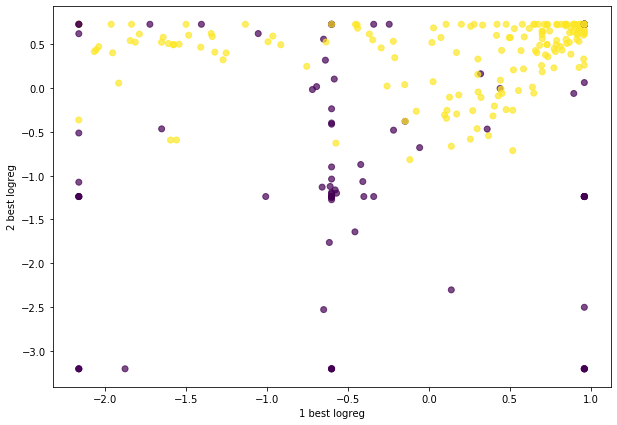

In [310]:
plt.figure(figsize=(10, 7))
plt.xlabel('1 best logreg')
plt.ylabel('2 best logreg')
plt.scatter(
    xTrain_best3[:,0],
    xTrain_best3[:,1],
    c=yTrain,
    cmap='viridis',
    alpha=0.7,
    
)
plt.show()

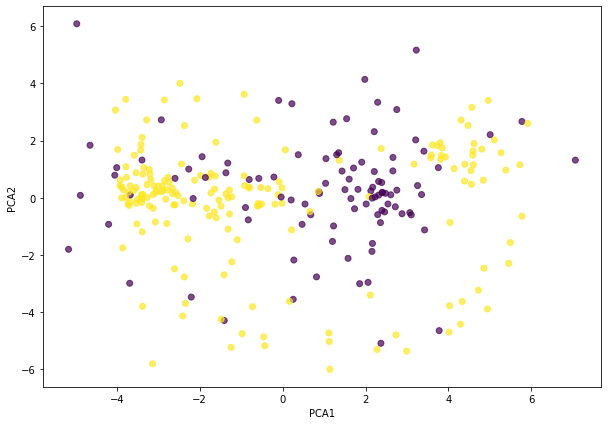

In [311]:
#first 2 PCA
plt.figure(figsize=(10, 7))
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.scatter(
    Xtrain_transformed2[:,0],
    Xtrain_transformed2[:,1],
    c=yTrain,
    cmap='viridis',
    alpha=0.7,
   
)
plt.show()

In [292]:
#m 2 dim. transform PCA
pca3=PCA(n_components=2)
pca3.fit(xTrain)
Xtrain_transformed3 = pca3.transform(xTrain)
Xtest_transformed3 = pca3.transform(xTest)


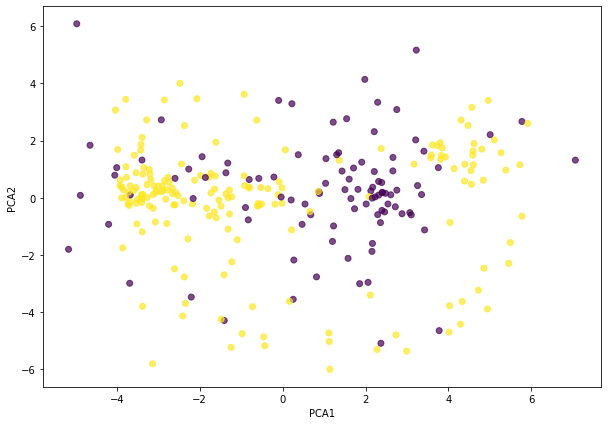

In [308]:
plt.figure(figsize=(10, 7))
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.scatter(
    Xtrain_transformed3[:,0],
    Xtrain_transformed3[:,1],
    c=yTrain,
    cmap='viridis',
    alpha=0.7,

)
plt.show()

In [374]:
#2 dim. transform  LDA
lda=LDA(K=2)
lda.fit(np.array(xTrain), np.array(yTrain))
xTrain_lda=lda.transform(np.array(xTrain))
xTest_lda=lda.transform(np.array(xTest))


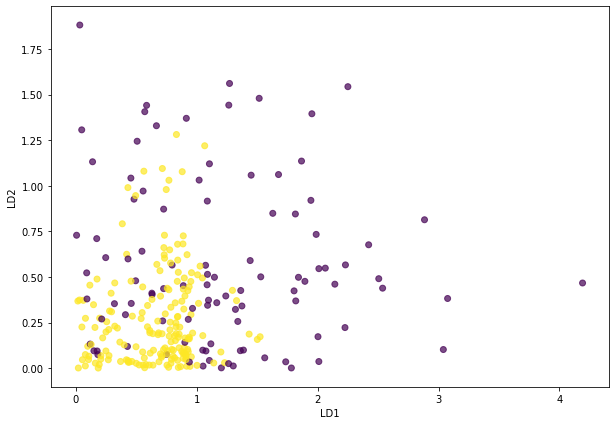

In [375]:
plt.figure(figsize=(10, 7))
plt.xlabel('LD1')
plt.ylabel('LD2')
plt.scatter(
    xTrain_lda[:,0],
    xTrain_lda[:,1],
    c=yTrain,
    cmap='viridis',
    alpha=0.7,
    
)
plt.show()